# 05 — Inspect Feature Extraction

Visual inspection of all **11 feature groups** (87 dense + 6 GLCM = 93 total).

| # | Group | Count |
|---|---|---|
| 1 | Optical Density | 3 |
| 2 | Color Stats (LAB+HSV+HED) | 54 |
| 3 | LBP | 3 |
| 4 | Gabor Bank | 12 |
| 5 | Sobel + LoG | 5 |
| 6 | Structure Tensor | 3 |
| 7 | DoG Scale Space | 3 |
| 8 | Superpixel Context | 2 |
| 9 | Local Entropy | 1 |
| 10 | Edge Distance | 1 |
| 11 | GLCM (per sample) | 6 |

In [1]:
import sys, os, time
sys.path.insert(0, os.path.abspath('..'))
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from src.preprocessing.stain_normalizer import MacenkoNormalizer
from src.preprocessing.color_converter import convert_image
from src.features.pixel_feature_extractor import (
    compute_od_features, compute_color_features_cpu,
    compute_lbp_features, compute_gabor_features,
    compute_gradient_features_cpu, compute_structure_tensor_features,
    compute_dog_features, compute_superpixel_features,
    compute_entropy_feature, compute_edge_distance,
    compute_glcm_for_samples, DENSE_FEATURES, TOTAL_FEATURES
)
from src.data.label_generator import generate_binary_labels
from src.sampling.pixel_sampler import active_boundary_mining
plt.rcParams['figure.dpi'] = 120
plt.rcParams['font.size'] = 9
print('Setup complete.')

Setup complete.


## 1. Load & Normalize a Sample Image

Selecting reference from 50 candidates...
Fit OK — image 33  (OD=0.3510, tissue=0.998)


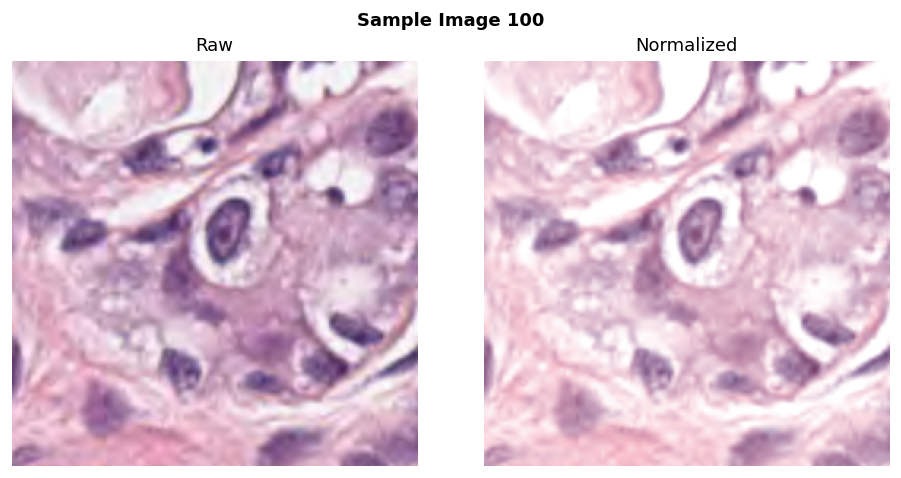

In [2]:
images = np.load('../data/raw/Fold1/images/fold1/images.npy', mmap_mode='r')
masks = np.load('../data/raw/Fold1/masks/fold1/masks.npy', mmap_mode='r')
normalizer = MacenkoNormalizer()
normalizer.fit(images[:50])
IDX = 100  # sample image
img_raw = np.clip(images[IDX], 0, 255).astype(np.uint8)
img_norm = normalizer.transform(img_raw)
spaces = convert_image(img_norm)
gray = spaces['lab'][:,:,0].astype(np.float32)
fig, ax = plt.subplots(1, 2, figsize=(8, 4))
ax[0].imshow(img_raw); ax[0].set_title('Raw'); ax[0].axis('off')
ax[1].imshow(img_norm); ax[1].set_title('Normalized'); ax[1].axis('off')
plt.suptitle(f'Sample Image {IDX}', fontweight='bold')
plt.tight_layout(); plt.show()

## 2. Group 1 — Optical Density (3 features)

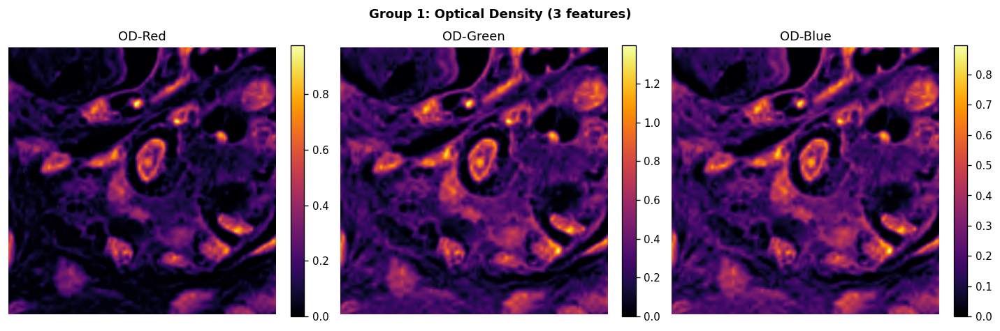

High OD in blue channel → high probability of nucleus (Beer-Lambert law)


In [3]:
od = compute_od_features(spaces['rgb'])
titles = ['OD-Red', 'OD-Green', 'OD-Blue']
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
for i in range(3):
    im = ax[i].imshow(od[:,:,i], cmap='inferno')
    ax[i].set_title(titles[i]); ax[i].axis('off')
    plt.colorbar(im, ax=ax[i], fraction=0.046)
plt.suptitle('Group 1: Optical Density (3 features)', fontweight='bold')
plt.tight_layout(); plt.show()
print('High OD in blue channel → high probability of nucleus (Beer-Lambert law)')

## 3. Group 2 — Color Statistics (54 features)
Showing mean at each scale for HED-H channel (the most biologically meaningful).

Color features computed in 0.1s, shape=(256, 256, 54)


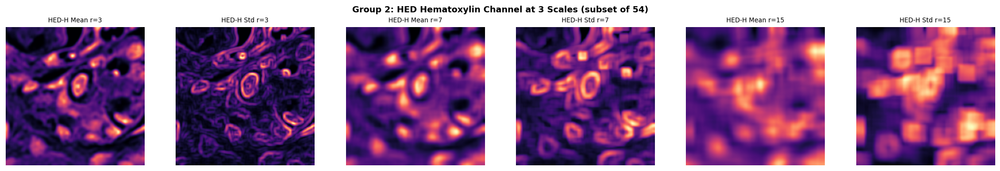

In [4]:
t0 = time.time()
color_feats = compute_color_features_cpu(spaces)  # (256,256,54)
print(f'Color features computed in {time.time()-t0:.1f}s, shape={color_feats.shape}')
# HED channels start at index 36 (after LAB 18 + HSV 18)
# HED-H: mean@r3=idx36, std@r3=37, mean@r7=38, std@r7=39, mean@r15=40, std@r15=41
hed_h_indices = {'Mean r=3': 36, 'Std r=3': 37, 'Mean r=7': 38,
                 'Std r=7': 39, 'Mean r=15': 40, 'Std r=15': 41}
fig, ax = plt.subplots(1, 6, figsize=(18, 3))
for i, (name, idx) in enumerate(hed_h_indices.items()):
    im = ax[i].imshow(color_feats[:,:,idx], cmap='magma')
    ax[i].set_title(f'HED-H {name}', fontsize=8); ax[i].axis('off')
plt.suptitle('Group 2: HED Hematoxylin Channel at 3 Scales (subset of 54)', fontweight='bold')
plt.tight_layout(); plt.show()

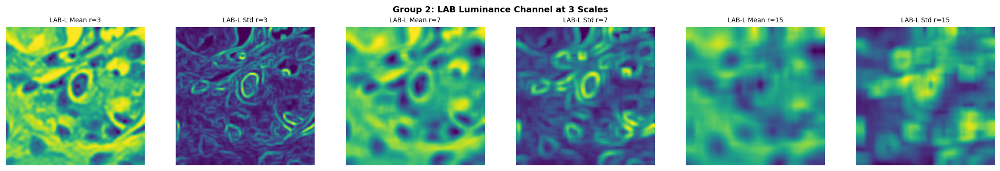

In [5]:
# LAB L-channel statistics (darkness = dominant visual cue)
lab_l_indices = {'Mean r=3': 0, 'Std r=3': 1, 'Mean r=7': 2,
                 'Std r=7': 3, 'Mean r=15': 4, 'Std r=15': 5}
fig, ax = plt.subplots(1, 6, figsize=(18, 3))
for i, (name, idx) in enumerate(lab_l_indices.items()):
    im = ax[i].imshow(color_feats[:,:,idx], cmap='viridis')
    ax[i].set_title(f'LAB-L {name}', fontsize=8); ax[i].axis('off')
plt.suptitle('Group 2: LAB Luminance Channel at 3 Scales', fontweight='bold')
plt.tight_layout(); plt.show()

## 4. Group 3 — LBP (3 features)

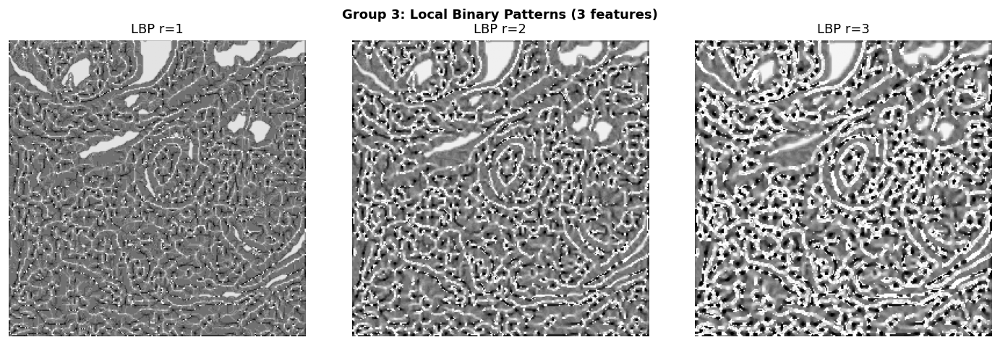

Chromatin granularity captured at sub-nuclear (r=1) to boundary (r=3) scales


In [6]:
lbp = compute_lbp_features(gray)
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
for i, r in enumerate([1, 2, 3]):
    ax[i].imshow(lbp[:,:,i], cmap='gray')
    ax[i].set_title(f'LBP r={r}'); ax[i].axis('off')
plt.suptitle('Group 3: Local Binary Patterns (3 features)', fontweight='bold')
plt.tight_layout(); plt.show()
print('Chromatin granularity captured at sub-nuclear (r=1) to boundary (r=3) scales')

## 5. Group 4 — Gabor Bank (12 features)

Gabor computed in 0.8s


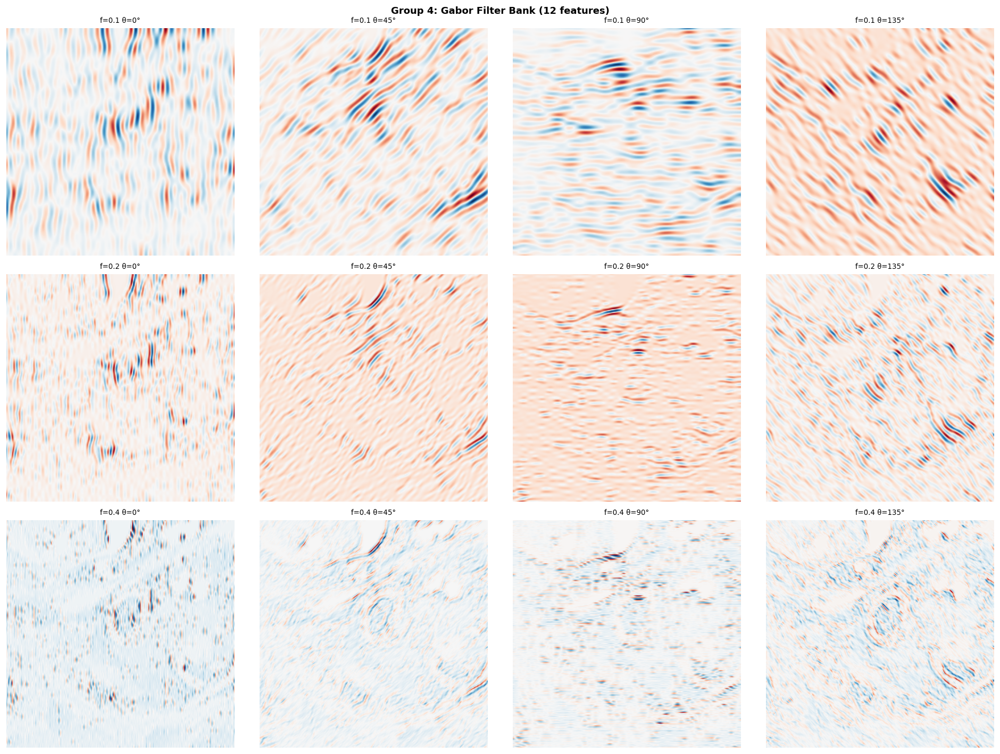

Nuclei respond isotropically (similar across θ); stroma is anisotropic


In [7]:
t0 = time.time()
gabor = compute_gabor_features(gray)
print(f'Gabor computed in {time.time()-t0:.1f}s')
fig, ax = plt.subplots(3, 4, figsize=(16, 12))
freqs = [0.1, 0.2, 0.4]
thetas = ['0°', '45°', '90°', '135°']
k = 0
for r in range(3):
    for c in range(4):
        ax[r,c].imshow(gabor[:,:,k], cmap='RdBu_r')
        ax[r,c].set_title(f'f={freqs[r]} θ={thetas[c]}', fontsize=8)
        ax[r,c].axis('off'); k += 1
plt.suptitle('Group 4: Gabor Filter Bank (12 features)', fontweight='bold')
plt.tight_layout(); plt.show()
print('Nuclei respond isotropically (similar across θ); stroma is anisotropic')

## 6. Group 5 — Gradient Features: Sobel + LoG (5 features)

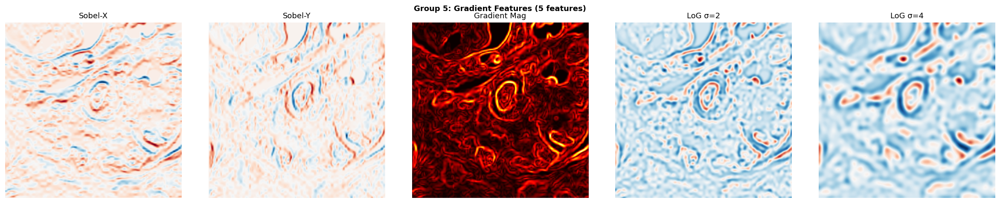

LoG is the strongest single feature for nucleus detection (blob response)


In [8]:
grad = compute_gradient_features_cpu(gray)
titles = ['Sobel-X', 'Sobel-Y', 'Gradient Mag', 'LoG σ=2', 'LoG σ=4']
cmaps = ['RdBu_r', 'RdBu_r', 'hot', 'RdBu_r', 'RdBu_r']
fig, ax = plt.subplots(1, 5, figsize=(20, 4))
for i in range(5):
    ax[i].imshow(grad[:,:,i], cmap=cmaps[i])
    ax[i].set_title(titles[i]); ax[i].axis('off')
plt.suptitle('Group 5: Gradient Features (5 features)', fontweight='bold')
plt.tight_layout(); plt.show()
print('LoG is the strongest single feature for nucleus detection (blob response)')

## 7. Group 6 — Structure Tensor (3 features)

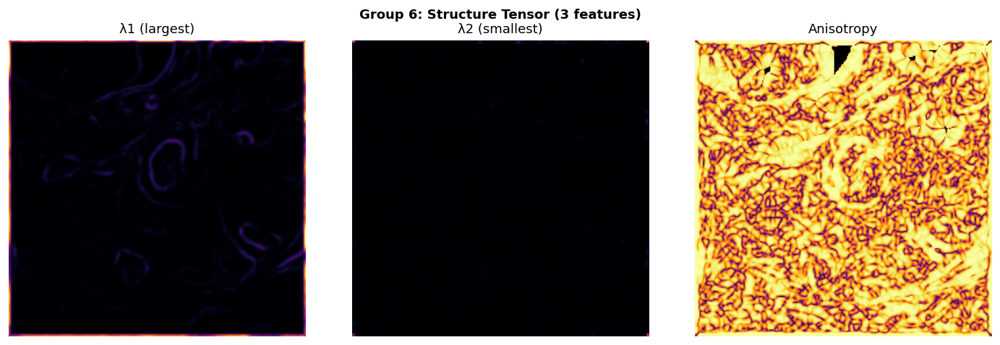

Low anisotropy → round nucleus; High anisotropy → elongated stroma


In [9]:
struct = compute_structure_tensor_features(gray)
titles = ['λ1 (largest)', 'λ2 (smallest)', 'Anisotropy']
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
for i in range(3):
    ax[i].imshow(struct[:,:,i], cmap='inferno')
    ax[i].set_title(titles[i]); ax[i].axis('off')
plt.suptitle('Group 6: Structure Tensor (3 features)', fontweight='bold')
plt.tight_layout(); plt.show()
print('Low anisotropy → round nucleus; High anisotropy → elongated stroma')

## 8. Group 7 — Difference of Gaussians (3 features)

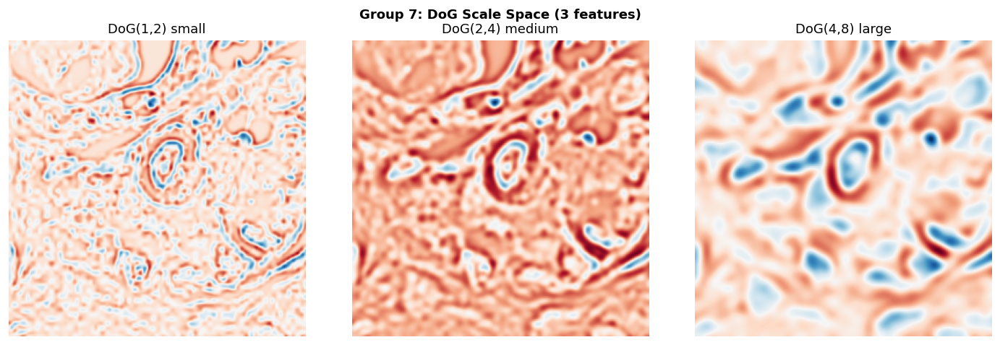

Each scale responds to different nucleus sizes: lymphocyte → epithelial → neoplastic


In [10]:
dog = compute_dog_features(gray)
titles = ['DoG(1,2) small', 'DoG(2,4) medium', 'DoG(4,8) large']
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
for i in range(3):
    ax[i].imshow(dog[:,:,i], cmap='RdBu_r')
    ax[i].set_title(titles[i]); ax[i].axis('off')
plt.suptitle('Group 7: DoG Scale Space (3 features)', fontweight='bold')
plt.tight_layout(); plt.show()
print('Each scale responds to different nucleus sizes: lymphocyte → epithelial → neoplastic')

## 9. Groups 8–10 — Superpixel, Entropy, Edge Distance

Spatial features computed in 0.2s


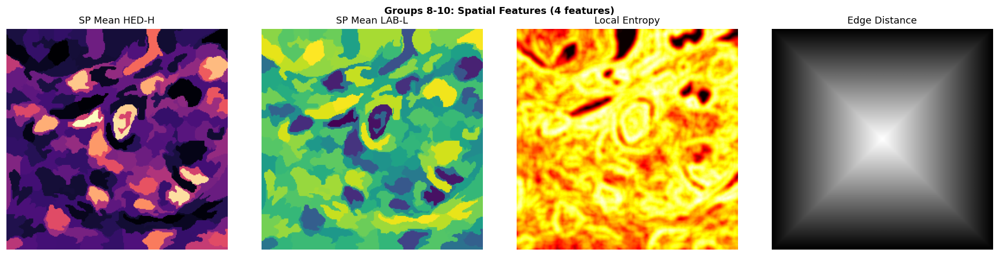

In [11]:
t0 = time.time()
sp = compute_superpixel_features(spaces)
ent = compute_entropy_feature(gray)
edge = compute_edge_distance()
print(f'Spatial features computed in {time.time()-t0:.1f}s')

fig, ax = plt.subplots(1, 4, figsize=(16, 4))
ax[0].imshow(sp[:,:,0], cmap='magma')
ax[0].set_title('SP Mean HED-H'); ax[0].axis('off')
ax[1].imshow(sp[:,:,1], cmap='viridis')
ax[1].set_title('SP Mean LAB-L'); ax[1].axis('off')
ax[2].imshow(ent[:,:,0], cmap='hot')
ax[2].set_title('Local Entropy'); ax[2].axis('off')
ax[3].imshow(edge[:,:,0], cmap='gray')
ax[3].set_title('Edge Distance'); ax[3].axis('off')
plt.suptitle('Groups 8-10: Spatial Features (4 features)', fontweight='bold')
plt.tight_layout(); plt.show()

## 10. Full Dense Feature Assembly

In [12]:
# Assemble all 87 dense features
all_groups = [od, color_feats, lbp, gabor, grad, struct, dog, sp, ent, edge]
dense = np.concatenate(all_groups, axis=-1)
print(f'Dense feature tensor shape: {dense.shape}')
assert dense.shape == (256, 256, DENSE_FEATURES), f'Expected (256,256,{DENSE_FEATURES})'
print(f'✓ Confirmed: {DENSE_FEATURES} dense features per pixel')
print(f'NaN count: {np.isnan(dense).sum()}')
print(f'Inf count: {np.isinf(dense).sum()}')

Dense feature tensor shape: (256, 256, 87)
✓ Confirmed: 87 dense features per pixel
NaN count: 0
Inf count: 0


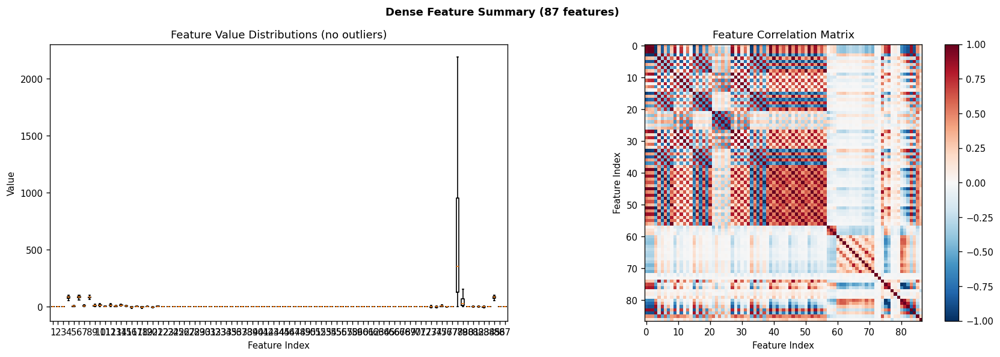

In [20]:
# Feature statistics summary
flat = dense.reshape(-1, DENSE_FEATURES)
fig, ax = plt.subplots(1, 2, figsize=(14, 5))
ax[0].boxplot([flat[:,i] for i in range(DENSE_FEATURES)], showfliers=False)
ax[0].set_xlabel('Feature Index')
ax[0].set_ylabel('Value')
ax[0].set_title('Feature Value Distributions (no outliers)')

# Correlation matrix of a random subset
rng = np.random.default_rng(42)
sample_idx = rng.choice(flat.shape[0], size=5000, replace=False)
corr = np.corrcoef(flat[sample_idx].T)
im = ax[1].imshow(corr, cmap='RdBu_r', vmin=-1, vmax=1)
ax[1].set_title('Feature Correlation Matrix')
ax[1].set_xlabel('Feature Index')
ax[1].set_ylabel('Feature Index')
plt.colorbar(im, ax=ax[1], fraction=0.046)
plt.suptitle(f'Dense Feature Summary ({DENSE_FEATURES} features)', fontweight='bold')
plt.tight_layout(); plt.show()

## 11. Group 11 — GLCM (6 per-sample features)

GLCM for 400 samples in 0.3s
GLCM shape: (400, 6)


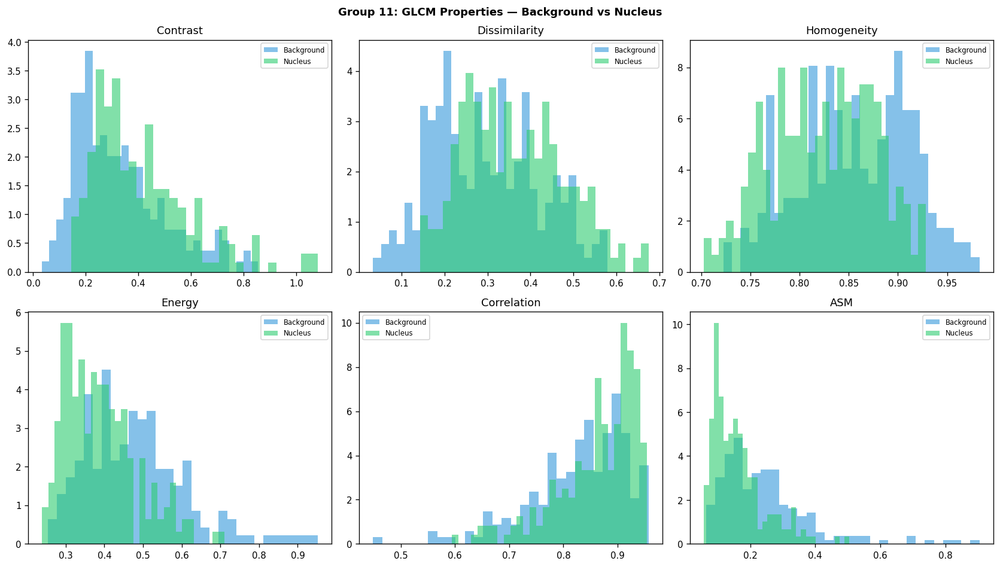


Final feature vector: 87 dense + 6 GLCM = 93 total


In [14]:
mask = masks[IDX]
labels = generate_binary_labels(mask)
indices, sampled_labels = active_boundary_mining(labels, n_per_class=200)

t0 = time.time()
glcm = compute_glcm_for_samples(gray, indices)
print(f'GLCM for {len(indices)} samples in {time.time()-t0:.1f}s')
print(f'GLCM shape: {glcm.shape}')

props = ['Contrast', 'Dissimilarity', 'Homogeneity', 'Energy', 'Correlation', 'ASM']
fig, ax = plt.subplots(2, 3, figsize=(14, 8))
for i in range(6):
    r, c = i // 3, i % 3
    for lbl, color, name in [(0, '#3498db', 'Background'), (1, '#2ecc71', 'Nucleus')]:
        m = sampled_labels == lbl
        ax[r,c].hist(glcm[m, i], bins=30, alpha=0.6, color=color, label=name, density=True)
    ax[r,c].set_title(props[i])
    ax[r,c].legend(fontsize=7)
plt.suptitle('Group 11: GLCM Properties — Background vs Nucleus', fontweight='bold')
plt.tight_layout(); plt.show()
print(f'\nFinal feature vector: {DENSE_FEATURES} dense + 6 GLCM = {TOTAL_FEATURES} total')

## 12. Timing Benchmark

In [15]:
n_bench = 5
times = []
for i in range(n_bench):
    t0 = time.time()
    img_n = normalizer.transform(np.clip(images[i], 0, 255).astype(np.uint8))
    sp_i = convert_image(img_n)
    g = sp_i['lab'][:,:,0].astype(np.float32)
    groups = [
        compute_od_features(sp_i['rgb']),
        compute_color_features_cpu(sp_i),
        compute_lbp_features(g),
        compute_gabor_features(g),
        compute_gradient_features_cpu(g),
        compute_structure_tensor_features(g),
        compute_dog_features(g),
        compute_superpixel_features(sp_i),
        compute_entropy_feature(g),
        compute_edge_distance(),
    ]
    dt = time.time() - t0
    times.append(dt)
    print(f'  Image {i}: {dt:.2f}s')
print(f'\nMean: {np.mean(times):.2f}s/image')
print(f'Estimated total (7904 images): {np.mean(times)*7904/3600:.1f} hours')

  Image 0: 1.14s
  Image 1: 1.03s
  Image 2: 0.99s
  Image 3: 0.99s
  Image 4: 0.99s

Mean: 1.03s/image
Estimated total (7904 images): 2.3 hours


## Summary

### Feature Pipeline Verified:
- **87 dense features** per pixel, zero NaN/Inf
- **6 GLCM features** per sampled pixel (post-sampling)
- **93 total** per training sample

### Key Observations:
- **HED-H** and **LAB-L** channels provide strongest nucleus signal
- **LoG σ=2** is the best single blob detector for nuclei
- **Anisotropy** cleanly separates round nuclei from elongated stroma
- **GLCM Homogeneity/Contrast** show clear class separation
- **Gabor** responses confirm nuclear isotropy vs stromal anisotropy

### Ready for `build_dataset.py`